In [1]:
%load_ext autoreload
%autoreload 2

import os
import numpy as np
import matplotlib.pyplot as plt
import m2py.segmentation.segmentation_gmm as seg_gmm
import m2py.segmentation.segmentation_watershed as seg_water
from m2py.utils import pre_processing as pre
from m2py.utils import post_processing as post
from m2py.utils import seg_label_utils as slu
from m2py.utils import config


## Data Loading

In [2]:
data_dir = os.path.join(os.getcwd(), "../data")

In [3]:
# Plotting hyper-parameters

fill_zeros_flag = True
noise_removal_flag = True
input_cmap = "jet"

In [4]:
# Loading data

# Paper Figure 6
data_file = os.path.join(data_dir, "sample3.npy")
data_type = "Full_QNM"
data_subtype = "P3HT:PCBM_OPV"

data = np.load(data_file)

data_properties = config.data_info[data_type]['properties']
print(f"Shape of input data is: {data.shape}")
print(f"Properties are: {data_properties}")


Shape of input data is: (256, 256, 8)
Properties are: ['Zscale', 'Height', 'PFE', 'Stiffness', 'LogDMT', 'Adhesion', 'Deformation', 'Dissipation']


## A-Priori Statistical Analysis

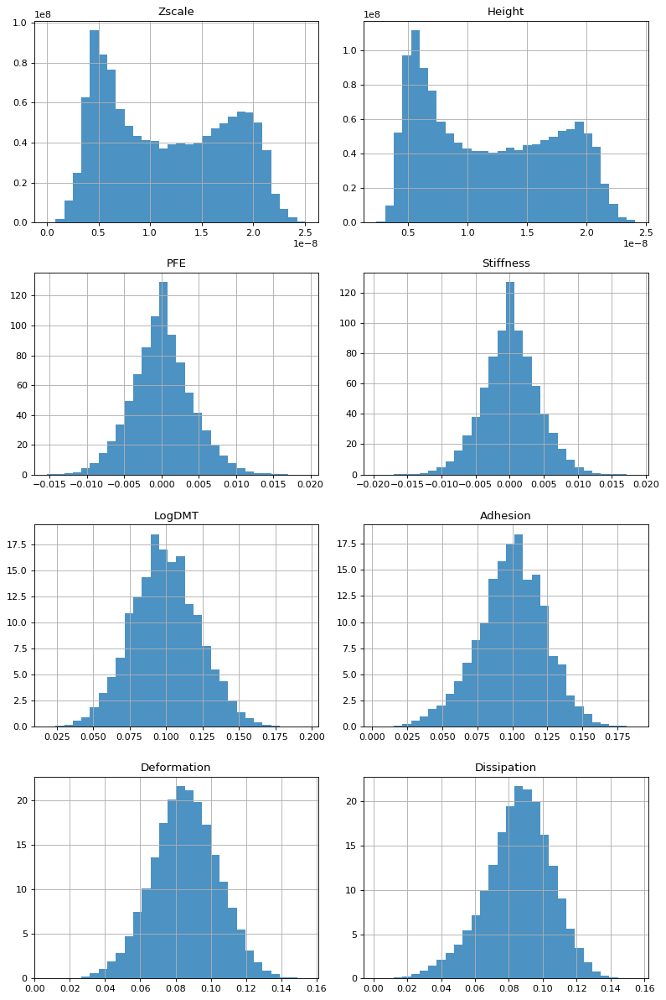

In [5]:
# Show property distributions

pre.show_property_distributions(data, data_type)
    

## Outlier Extraction

/Users/diegotorrejon/Projects/Other/m2py/VENV/lib/python3.6/site-packages/scipy/fftpack/basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


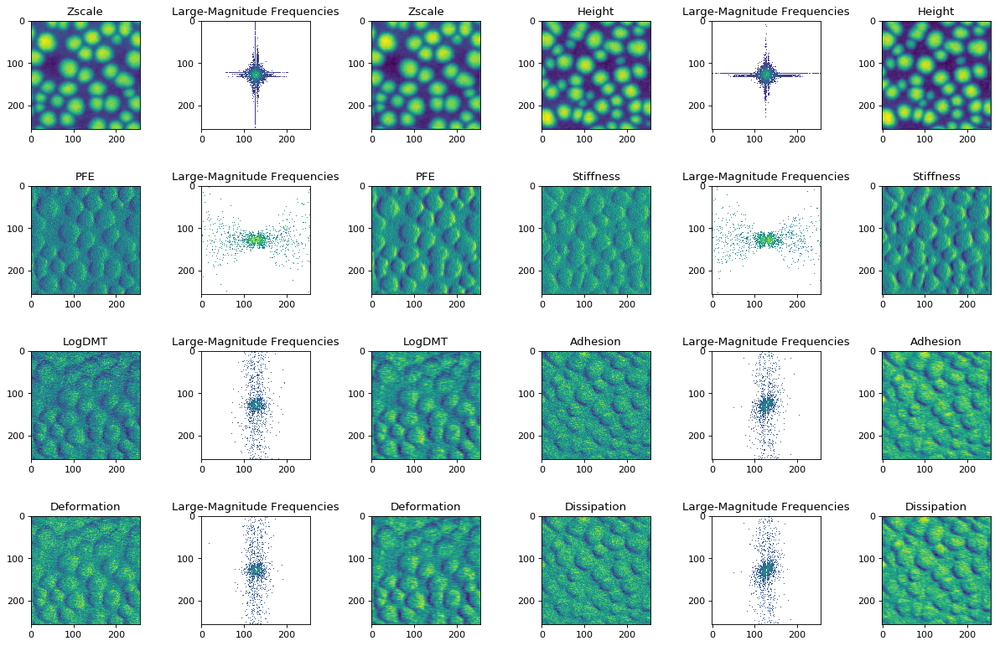

In [6]:
# Apply high pass filter

filtered_data = pre.apply_frequency_removal(data, data_type)


There were 1 chips generated.


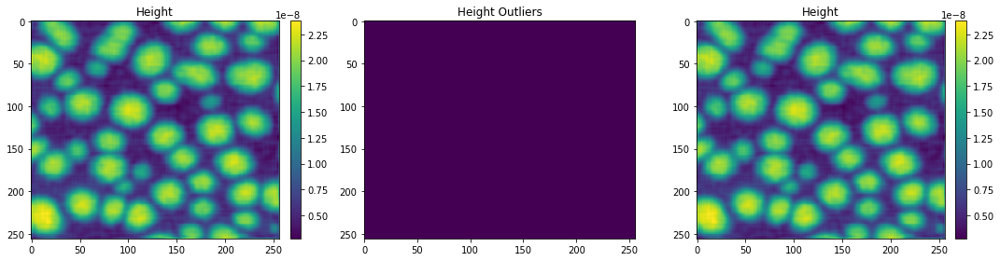

In [7]:
# Get outliers from height property

outliers = pre.extract_outliers(filtered_data, data_type, "Height", 2.5, 256, 256)
pre.show_outliers(filtered_data, data_type, "Height", outliers)
no_outliers_data = pre.smooth_outliers_from_data(filtered_data, outliers)


In [8]:
# Remove noisy channels: This method removes channels without any statistical information.

data, new_data_properties = pre.remove_noisy_channels(no_outliers_data, data_properties)


## Semantic Segmentation

In [9]:
# Apply semantic segmentation

c = data.shape[2]
num_pca_components = min(4, c)

seg = seg_gmm.SegmenterGMM(n_components=2, embedding_dim=num_pca_components,
                           nonlinear=True, normalize=True,
                          padding=0, zscale=False)

if noise_removal_flag:
    pre_labels = seg.fit_transform(no_outliers_data, outliers)
else:
    pre_labels = seg.fit_transform(data)
    
if fill_zeros_flag:
    pre_labels = slu.fill_out_zeros(pre_labels, outliers)
elif noise_removal_flag:
    pre_labels = np.ma.masked_where(outliers == 1, pre_labels)


In [478]:
# Store results of GMM. This is an optional cell.

#seg.store_pca_components(data, "pca_components.npy")    
#post.store_results(pre_labels, "semantic_segmentation_result.npy")

In [10]:
# Post-processing using morphological cleanup. This is an optional cell.

from skimage import morphology

pre_labels = morphology.opening(pre_labels, morphology.disk(1))
pre_labels = pre_labels - 1 > 0
pre_labels = morphology.remove_small_objects(pre_labels, min_size=500)
pre_labels = pre_labels.astype(np.uint8) + 1


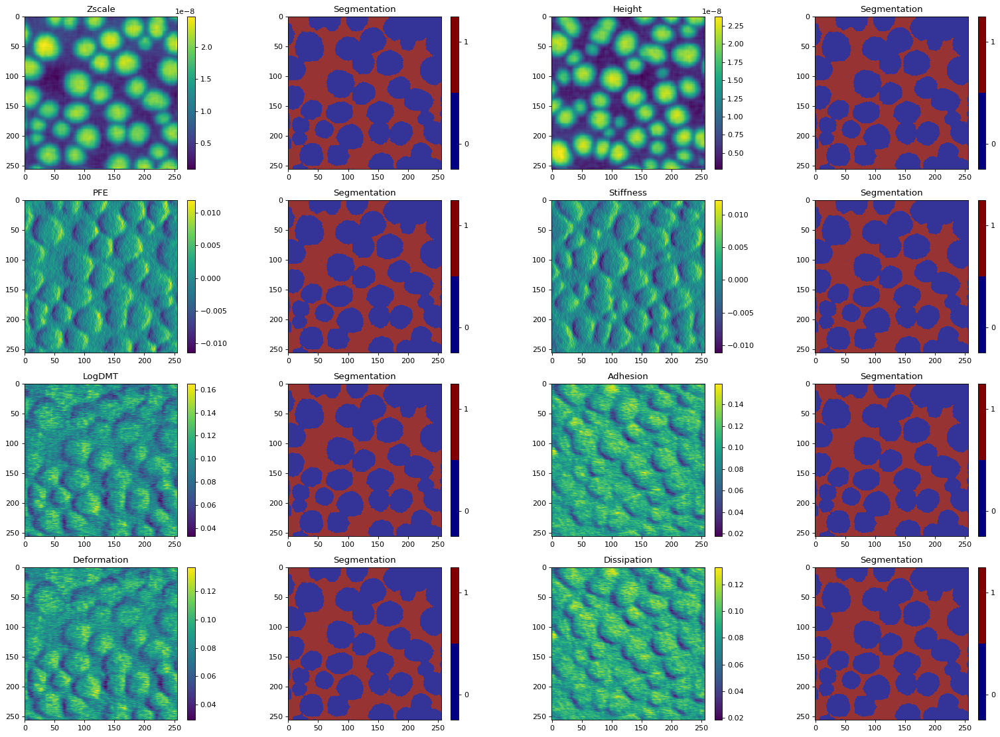

In [11]:
# Plot semantic segmentation

if noise_removal_flag:
    post.show_classification(pre_labels, no_outliers_data, data_type)
else:
    post.show_classification(pre_labels, data, data_type)
    

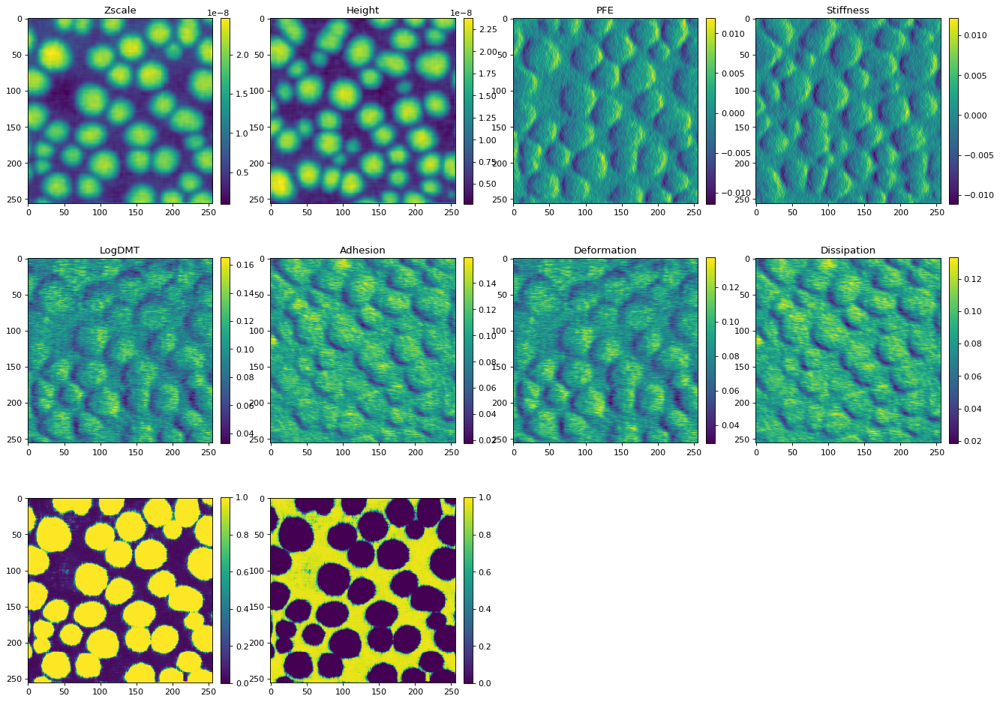

In [12]:
# Semantic segmentation: uncertainty of predictions

if fill_zeros_flag:
    probs = seg.get_probabilities(no_outliers_data)
    probs = slu.fill_out_zeros(probs, outliers)

    post.show_overlaid_distribution(probs, no_outliers_data, data_type)
elif noise_removal_flag:
    probs = seg.get_probabilities(no_outliers_data)
    post.show_overlaid_distribution(probs, no_outliers_data, data_type, outliers)
else:
    probs = seg.get_probabilities(data)
    post.show_overlaid_distribution(probs, data, data_type)


## Semantic Segmentation: A-Posteriori Statistical Analysis

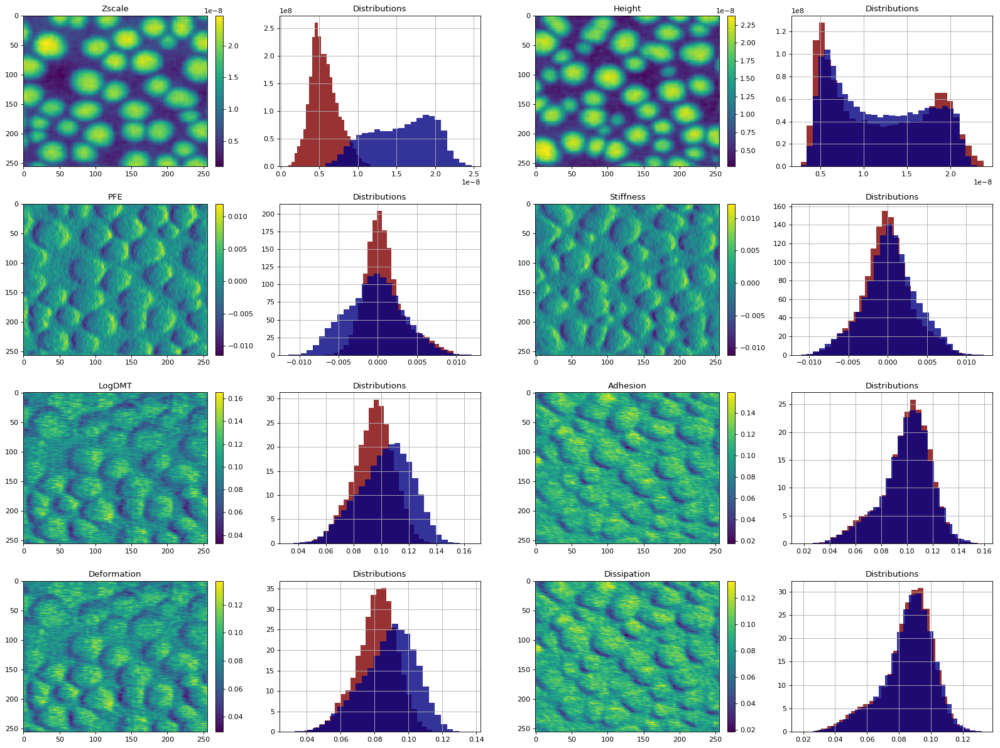

In [13]:
# Distributions of properties after semantic segmentation

if noise_removal_flag:
    post.show_classification_distributions(pre_labels, no_outliers_data, outliers, data_type)
else:
    post.show_classification_distributions(pre_labels, data, None, data_type)
    

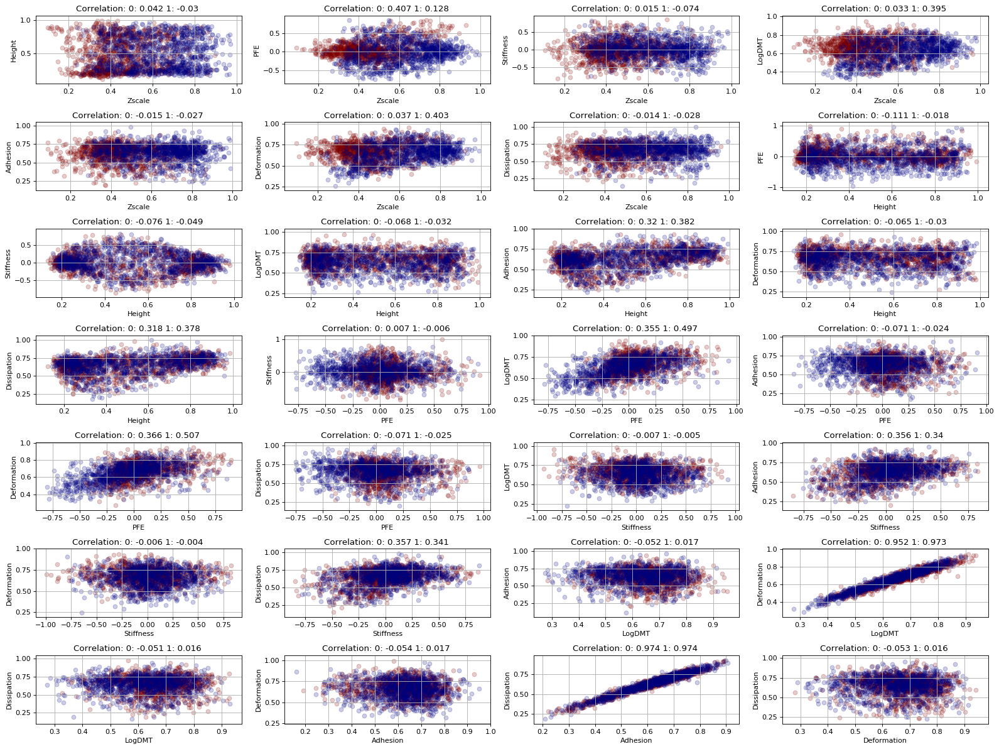

In [14]:
# Scatter plot and correlation of properties after semantic segmentation

if noise_removal_flag:
    post.show_classification_correlation(pre_labels, no_outliers_data, data_type)
else:
    post.show_classification_correlation(pre_labels, data, data_type)
    

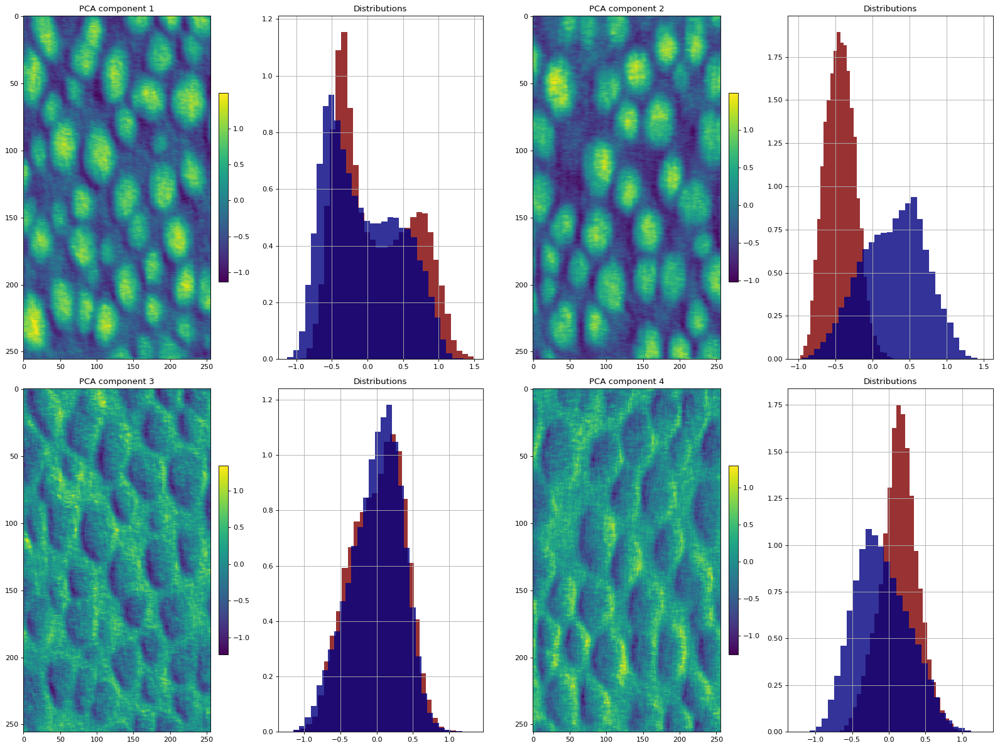

In [15]:
# Distributions of PCA components after semantic segmentation

if noise_removal_flag:
    pca_components = seg.get_pca_components(no_outliers_data)
else:
    pca_components = seg.get_pca_components(data)

h, w, c = data.shape
pca_components = pca_components.reshape(h, w, num_pca_components)

if noise_removal_flag:
    post.show_classification_distributions(pre_labels, pca_components, outliers, data_type, title_flag=False)
else:
    post.show_classification_distributions(pre_labels, pca_components, None, data_type, title_flag=False)



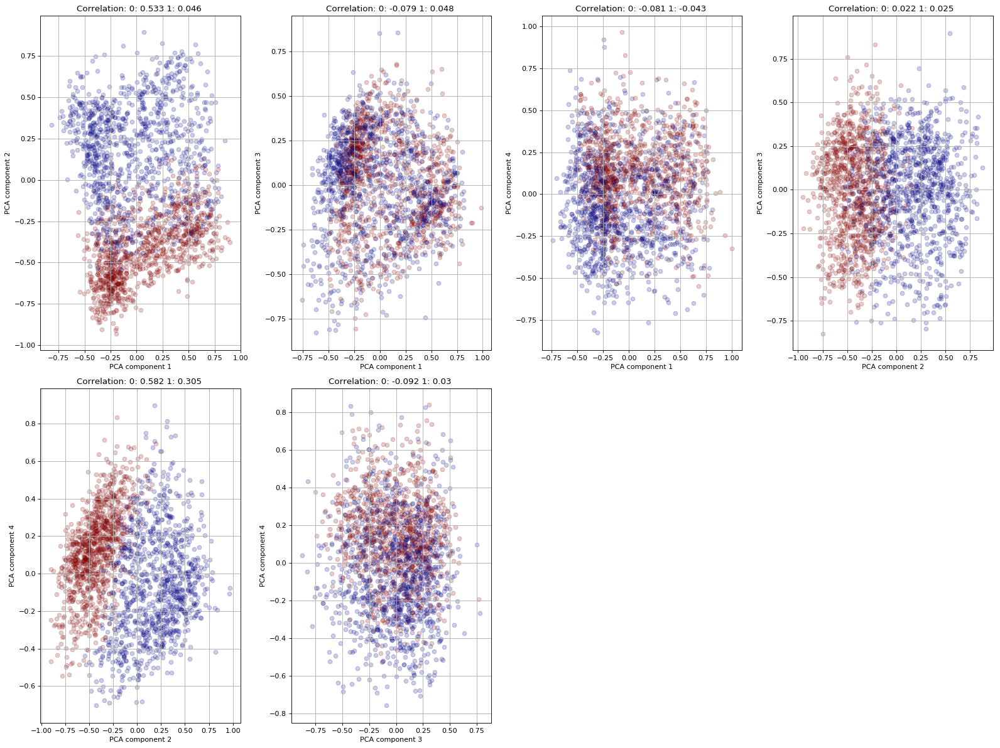

In [16]:
# Scatter plot and correlation of PCA components after semantic segmentation

post.show_classification_correlation(pre_labels, pca_components, data_type, title_flag=False)


## Instance Segmentation: Connected Components

In [17]:
# Apply instance segmentation (connected components)

post_labels = seg.get_grains(pre_labels)
grain_labels = slu.get_significant_labels(post_labels, bg_contrast_flag=True, label_thresh=500)

if fill_zeros_flag:
    grain_labels = slu.fill_out_zeros(grain_labels, grain_labels == 0)
elif noise_removal_flag:
    grain_labels = np.ma.masked_where(grain_labels == 0, grain_labels)

In [ ]:
# Store instance segmentation results. This is an optional cell.

#post.store_results(grain_labels, "instance_segmentation_result.npy")


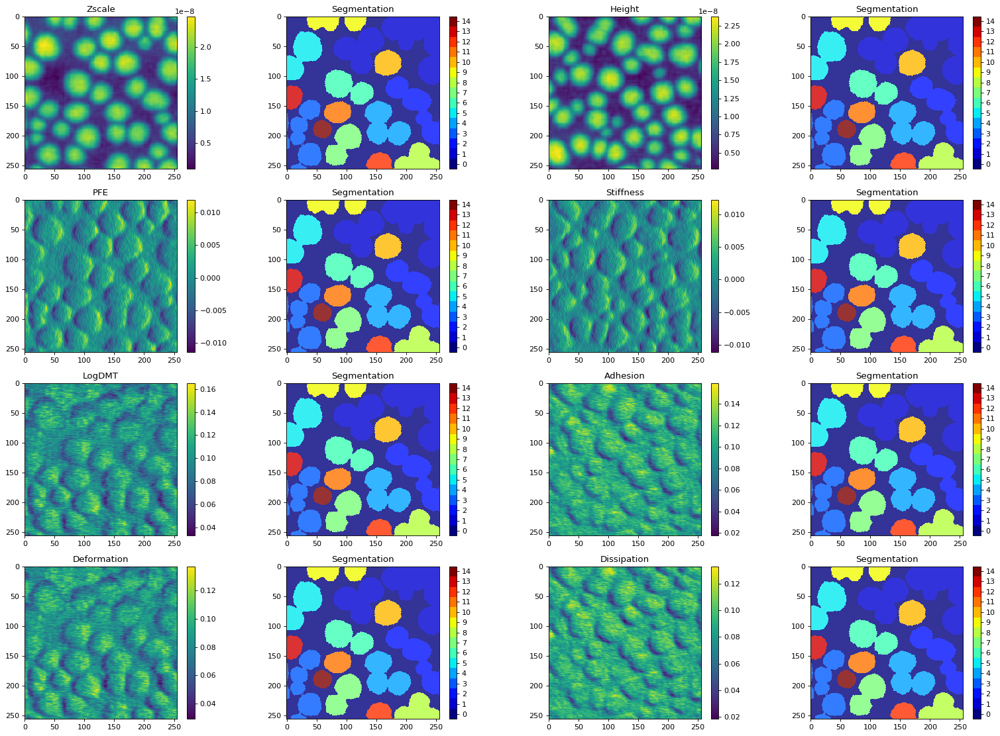

In [18]:
# Plot instance segmentation

if noise_removal_flag:
    post.show_classification(grain_labels, no_outliers_data, data_type, input_cmap=input_cmap)
else:
    post.show_classification(grain_labels, data, data_type, input_cmap=input_cmap)
    

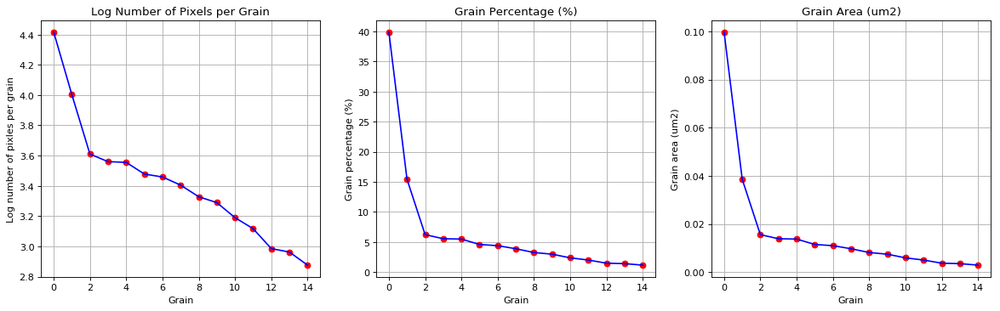

In [19]:
# Show grain area distribution after instance segmentation

post.show_grain_area_distribution(grain_labels, data_type, data_subtype)


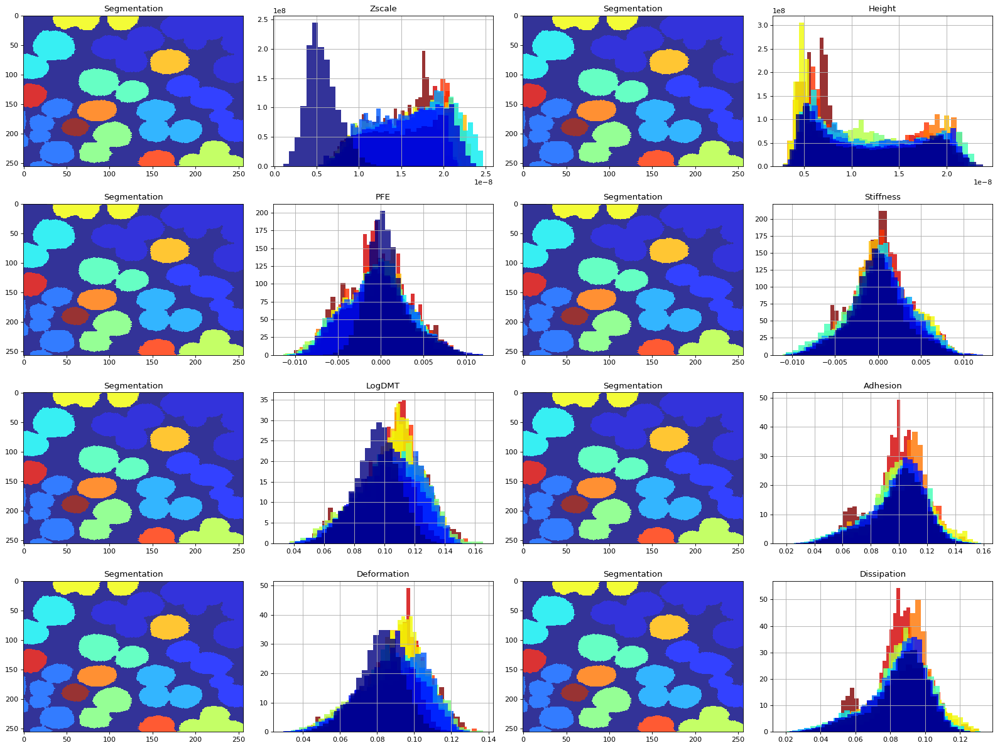

In [20]:
# Distributions of grains after instance segmentation

if noise_removal_flag:
    post.show_distributions_together(grain_labels, no_outliers_data, data_type, input_cmap=input_cmap)
else:
    post.show_distributions_together(grain_labels, data, data_type, input_cmap=input_cmap)
    

## Instance Segmentation: Persistence Watershed

In [21]:
# Apply instance segmentation (persistence watershed)

seg_w = seg_water.SegmenterWatershed()
height_id = new_data_properties.index("Zscale")

thresh = 0.1 # TODO: change to 0.01 for cAMF and AMFM and 0.4 otherwise. 0.3 for 2componentfilm
if noise_removal_flag:
    height_data = no_outliers_data[:, :, height_id]
    labels = seg_w.fit_transform(height_data, outliers, pers_thresh=thresh)
else:
    height_data = data[:, :, height_id]
    labels = seg_w.fit_transform(height_data, pers_thresh=thresh)
    
if fill_zeros_flag:
    labels = slu.fill_out_zeros(labels, labels == 0)
elif noise_removal_flag:
    labels = np.ma.masked_where(labels == 0, labels)
    

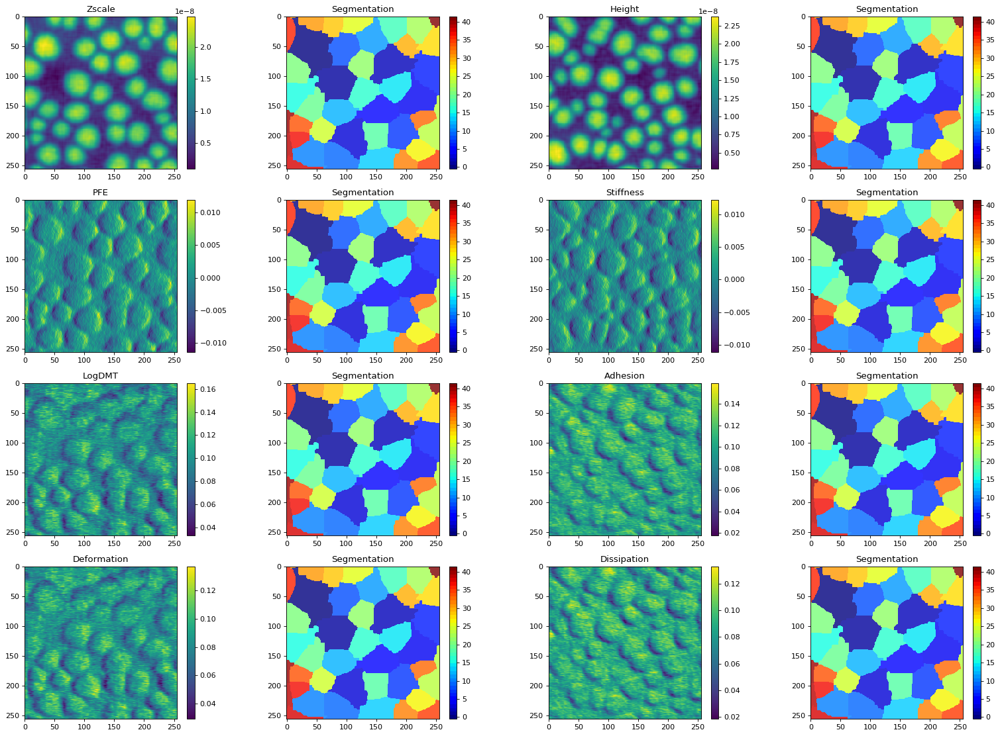

In [22]:
# Plot instance segmentation
if noise_removal_flag:
    post.show_classification(labels, no_outliers_data, data_type)
else:
    post.show_classification(labels, data, data_type)


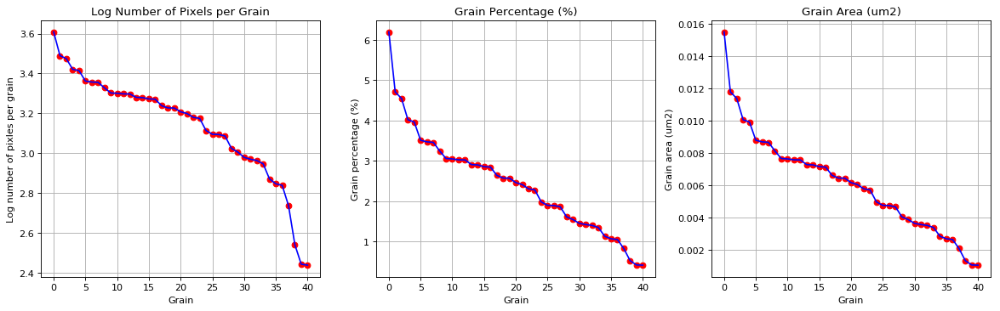

In [23]:
# Show grain area distribution after instance segmentation

post.show_grain_area_distribution(labels, data_type, data_subtype)

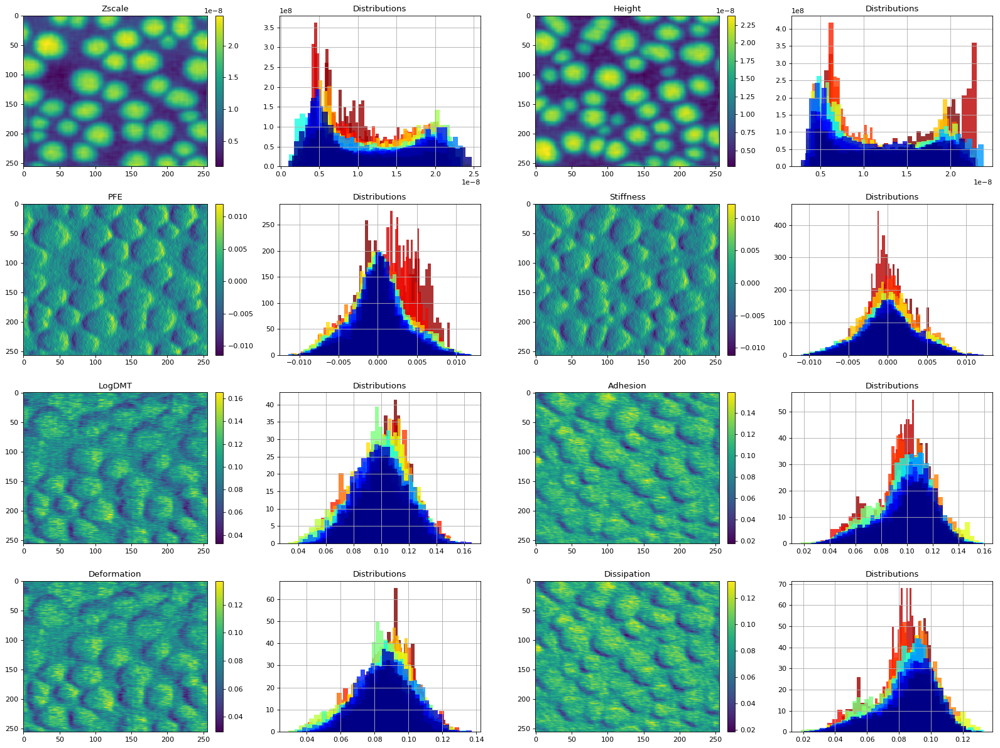

In [24]:
# Distributions of grains after instance segmentation

if noise_removal_flag:
    post.show_classification_distributions(labels, no_outliers_data, outliers, data_type)
else:
    post.show_classification_distributions(labels, data, None, data_type)


## Combining Semantic Segmentation and Instance Segmentation

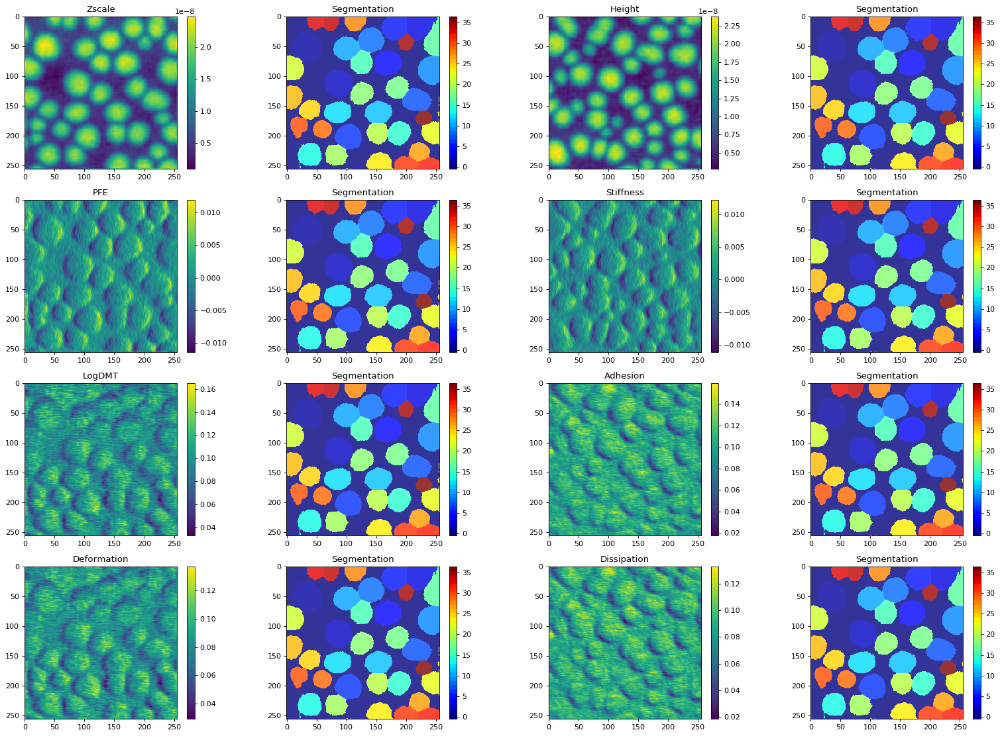

In [25]:
# Method #1: Remove instance segmentation arising from semantic segmentation background.

exp_labels = np.copy(labels)

# bg_id is the gmm component with the most instance segementations
bg_id = sorted(list(np.unique(pre_labels)), key = lambda k: np.size(np.unique(grain_labels[pre_labels == k])))[0]
exp_labels[pre_labels == bg_id] = np.max(exp_labels) + 1 # map background label (always indexed 1) of gmm to next pws label
for l in np.unique(exp_labels): # clean up small pws labels
    if np.sum(exp_labels == l) < 500:
        exp_labels = slu.fill_out_zeros(exp_labels, exp_labels == l)
    
exp_labels = slu.get_significant_labels(exp_labels, bg_contrast_flag=False)
if noise_removal_flag:
    post.show_classification(exp_labels, no_outliers_data, data_type)
else:
    post.show_classification(exp_labels, data, data_type)


Watershed Segmentation of GMM component 1


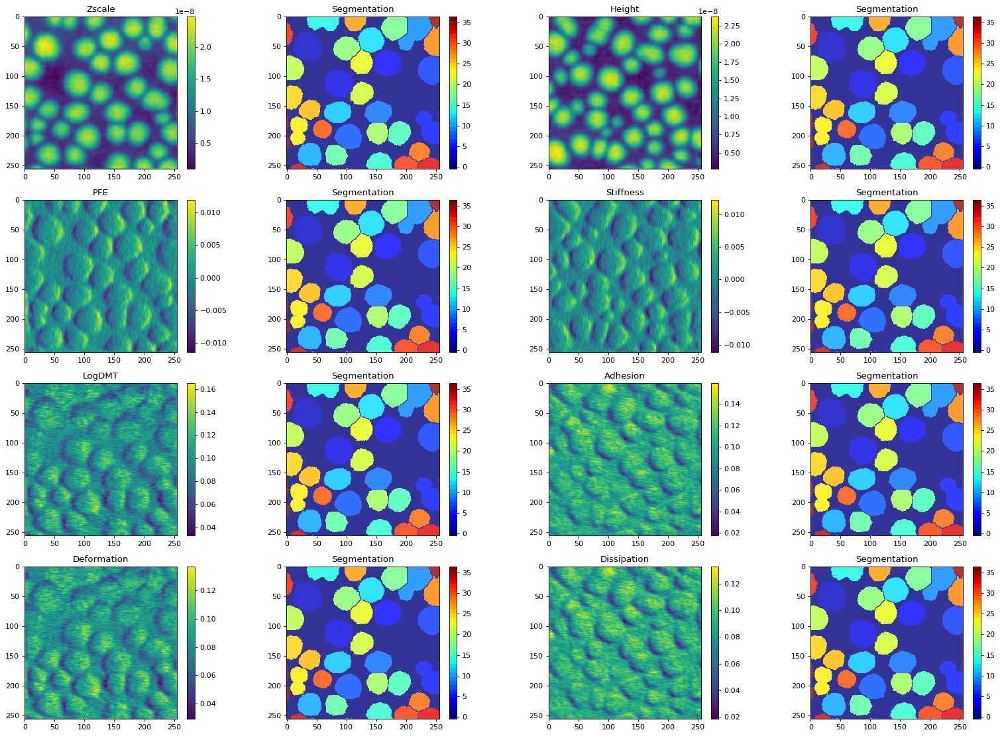

Watershed Segmentation of GMM component 2


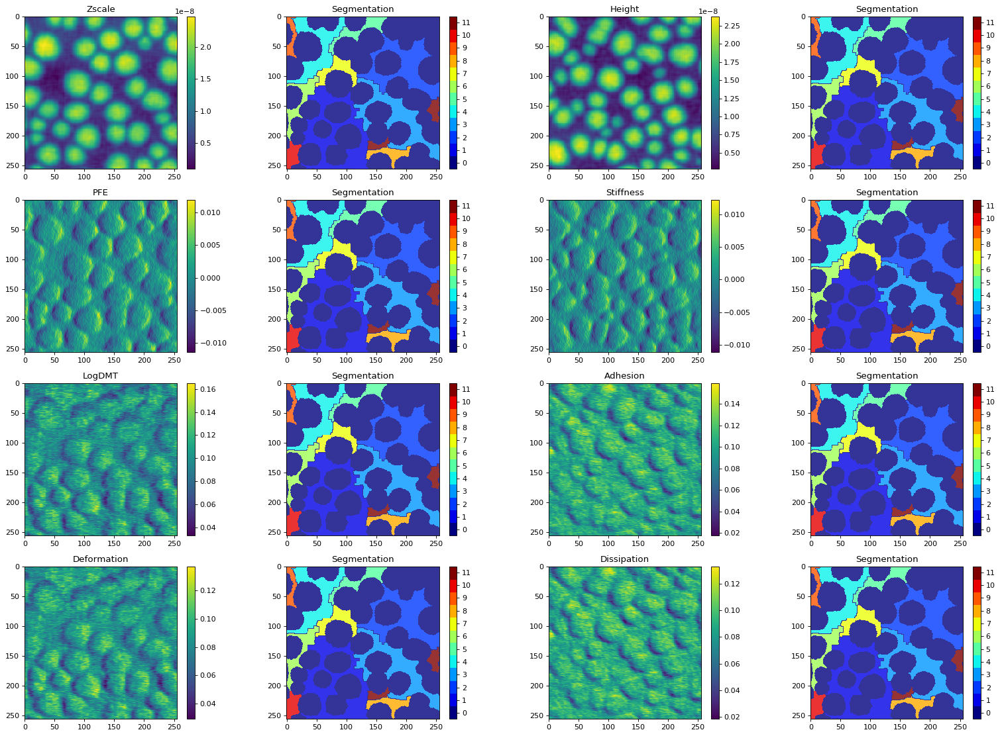

Watershed Segmentation of combined GMM components


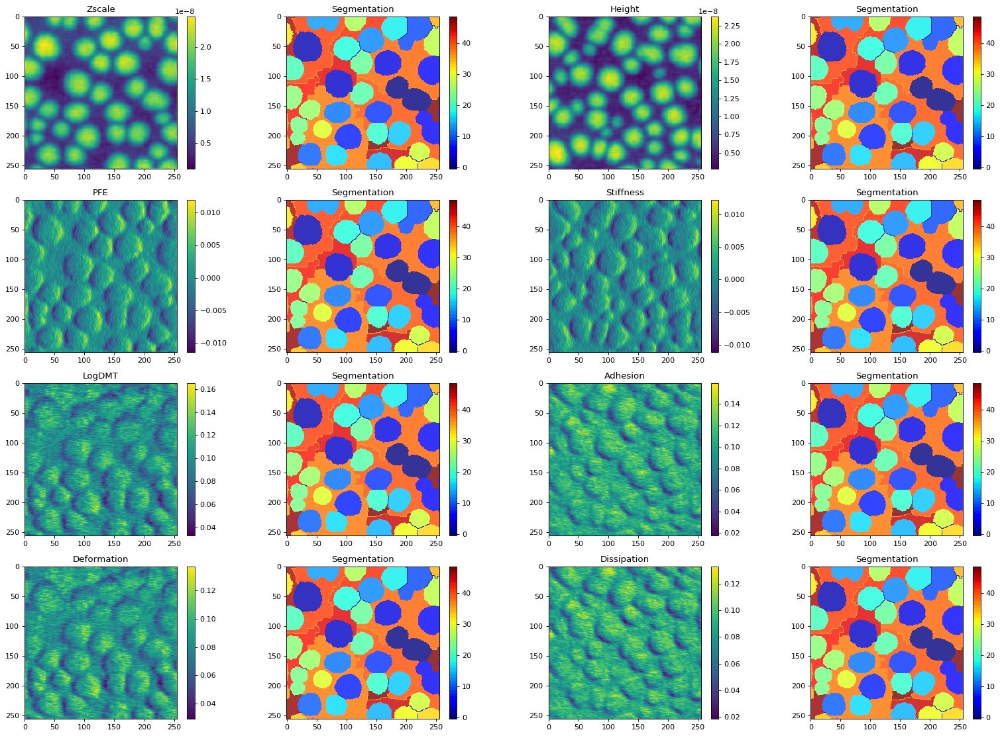

In [26]:
# Method #2: Instance segmentation per GMM class
comp_labels = list(np.unique(pre_labels))
if 0 in comp_labels: # Avoid outlier components / class
    comp_labels.remove(0)

height_id = new_data_properties.index("Zscale")

thresh = 0.3 # TODO: change to 0.01 for cAMF and AMFM and 0.4 otherwise. 0.3 for 2componentfilm

noise_removal_flag = False
final_output = np.zeros_like(data[:, :, 0], dtype=np.int64)
for l in comp_labels:
    if noise_removal_flag:
        height_data = no_outliers_data[:, :, height_id] * (pre_labels == l)
        temp_labels = seg_w.fit_transform(height_data, outliers, pers_thresh=thresh)
        temp_labels *= (pre_labels == l)
    else:
        height_data = data[:, :, height_id] * (pre_labels == l)
        temp_labels = seg_w.fit_transform(height_data, pers_thresh=thresh)
        temp_labels *= (pre_labels == l)
    
    # NOTE: no need to fill out zeros in this case

    # Instance (grains) segmentation of properties
    print(f"Watershed Segmentation of GMM component {l}")
    if noise_removal_flag:
        post.show_classification(temp_labels, no_outliers_data, data_type)
    else:
        post.show_classification(temp_labels, data, data_type)
    
    # Add results from different components
    temp_labels += np.max(final_output) # To distinguish labels from different components
    temp_labels *= (pre_labels == l) # Map other GMM component to 0 after relabeling

    final_output += temp_labels
    
# Instance (grains) segmentation of properties
print("Watershed Segmentation of combined GMM components")
if noise_removal_flag:
    post.show_classification(final_output, no_outliers_data, data_type)
else:
    post.show_classification(final_output, data, data_type)

    

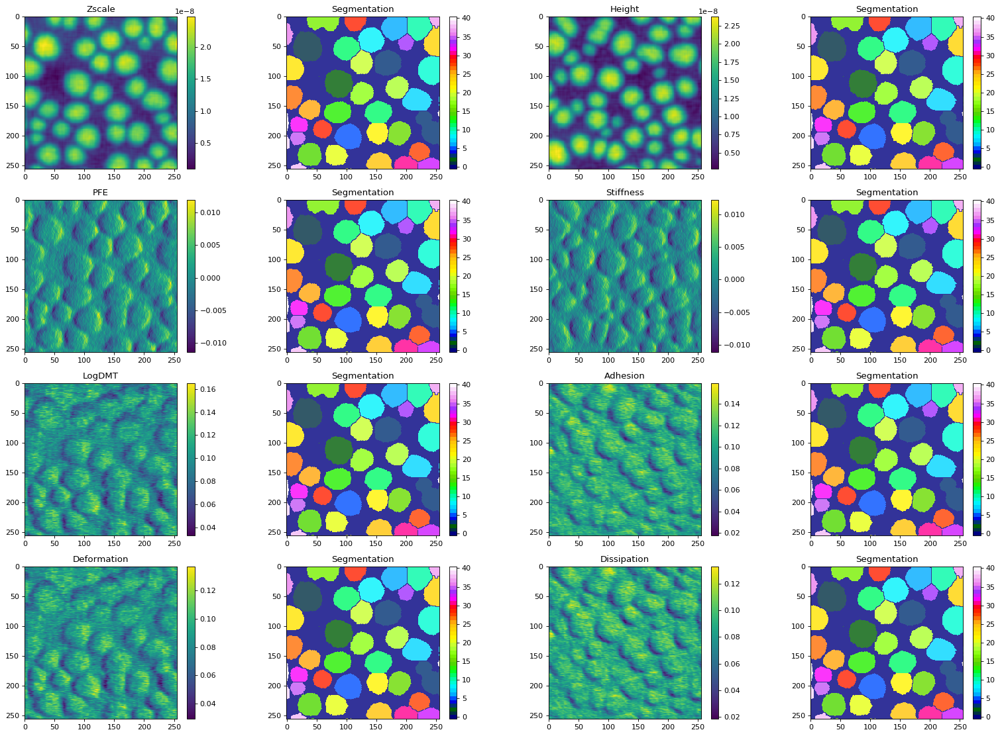

In [27]:
# Method #3: Perform instance segmentation on semantic segmentation non-background components

# bg_id is the gmm component with the most instance segementations
bg_id = sorted(list(np.unique(pre_labels)), key = lambda k: np.size(np.unique(grain_labels[pre_labels == k])))[0]

height_id = new_data_properties.index("Zscale")

thresh = 0.2 # TODO: change to 0.01 for cAMF and AMFM and 0.4 otherwise. 0.3 for 2componentfilm

noise_removal_flag = False
if noise_removal_flag:
    height_data = no_outliers_data[:, :, height_id] * (pre_labels != bg_id)
    temp_labels = seg_w.fit_transform(height_data, outliers, pers_thresh=thresh)
    temp_labels *= (pre_labels != bg_id)
else:
    height_data = data[:, :, height_id] * (pre_labels != bg_id)
    temp_labels = seg_w.fit_transform(height_data, pers_thresh=thresh)
    temp_labels *= (pre_labels != bg_id)
    
temp_labels = slu.get_significant_labels(temp_labels, bg_contrast_flag=True)
if noise_removal_flag:
    post.show_classification(temp_labels, no_outliers_data, data_type)
else:
    post.show_classification(temp_labels, data, data_type, input_cmap="gist_ncar")